### Import Libraries

In [1]:
import os
import shutil
import random
import cv2
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
import warnings
warnings.filterwarnings("ignore")

### Check if CUDA is available

In [2]:
# Check if TensorFlow was built with CUDA support
cuda_available = tf.test.is_built_with_cuda()
if cuda_available:
    print("CUDA is available in TensorFlow.")
else:
    print("CUDA is not available in TensorFlow.")

CUDA is available in TensorFlow.


In [3]:
# Check for available GPU devices
gpus_available = tf.config.experimental.list_physical_devices('GPU')
if gpus_available:
    print("GPUs available for TensorFlow:")
    for gpu in gpus_available:
        print(gpu)
else:
    print("No GPUs available for TensorFlow.")

GPUs available for TensorFlow:
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## A.) Data Exploration, Augmentation, Resize Resolution

Pada tahap awal, saya akan melakukan eksplorasi terhadap data tersebut dengan melihat histogram warnanya dan lakukan proses augmentasi data. Kemudian, melakukan resize resolusi gambar menjadi 224 x 224. Terakhir, memisahkan dataset menjadi 80% training set, 10% validation set dan 10% test set.

### 1.) Data Exploration

In [5]:
DATASET_PATH = "/content/drive/MyDrive/UTS/Dataset2/Dataset2A"
CLASS_NAMES = ['acai', 'acerola', 'apple', 'avocado']
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

Found 1600 images belonging to 4 classes.


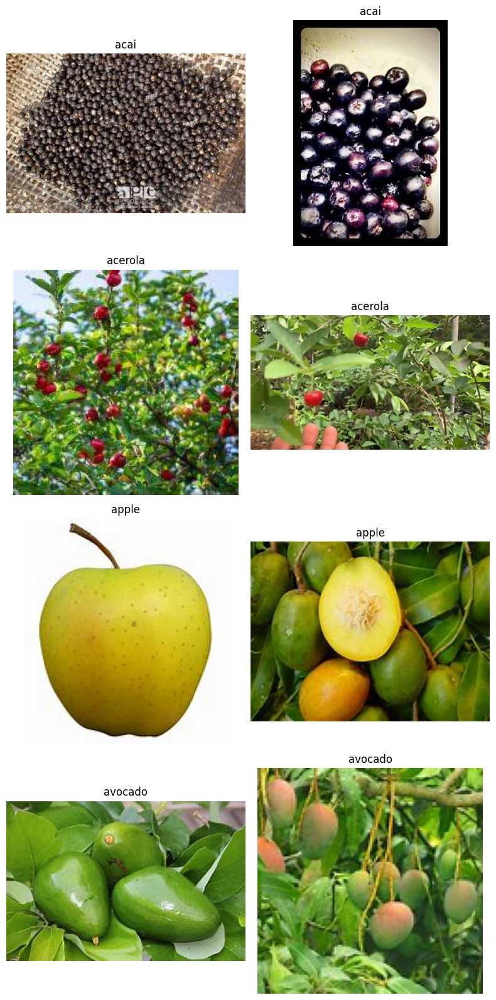

In [6]:
# Inisialisasi ImageDataGenerator
datagen = ImageDataGenerator()

# lOAD dataset
dataset = datagen.flow_from_directory(
    DATASET_PATH,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Mapping antara indeks kelas dan nama kelas
class_names = list(dataset.class_indices.keys())

# Mendapatkan beberapa contoh gambar dari setiap kelas
num_samples_per_class = 2
num_classes = len(class_names)
fig, axs = plt.subplots(num_classes, 2, figsize=(8, num_classes * 4))

for i, class_name in enumerate(class_names):
    class_dir = os.path.join(DATASET_PATH, class_name)
    filenames = os.listdir(class_dir)[:num_samples_per_class]
    for j, filename in enumerate(filenames):
        img_path = os.path.join(class_dir, filename)
        img = plt.imread(img_path)
        axs[i, j].imshow(img)
        axs[i, j].set_title(class_name)
        axs[i, j].axis('off')
plt.tight_layout()
plt.show()

In [7]:
# Mendapatkan informasi jumlah kelas dan jumlah gambar pada masing-masing kelas
num_classes = len(dataset.class_indices)
class_counts = dict(zip(dataset.class_indices.keys(), dataset.classes))

# Menghitung jumlah gambar pada setiap kelas
class_counts = {}
for class_name in os.listdir(DATASET_PATH):
    class_dir = os.path.join(DATASET_PATH, class_name)
    if os.path.isdir(class_dir):
        num_images = len(os.listdir(class_dir))
        class_counts[class_name] = num_images

# Cetak jumlah kelas dan nama kelas beserta jumlah gambar pada masing-masing kelas
print("Jumlah kelas:", len(class_counts))
print("Nama kelas dan jumlah gambar:")
for class_name, count in class_counts.items():
    print(f"- {class_name} --> {count} gambar")

Jumlah kelas: 4
Nama kelas dan jumlah gambar:
- avocado --> 400 gambar
- apple --> 400 gambar
- acerola --> 400 gambar
- acai --> 400 gambar


Dataset ini terdiri dari 4 class dan masing-masing class terdiri dari 400 gambar.

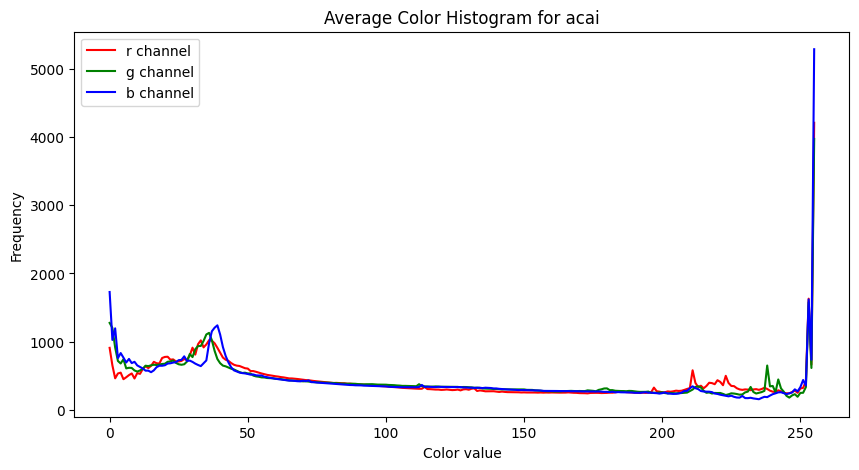

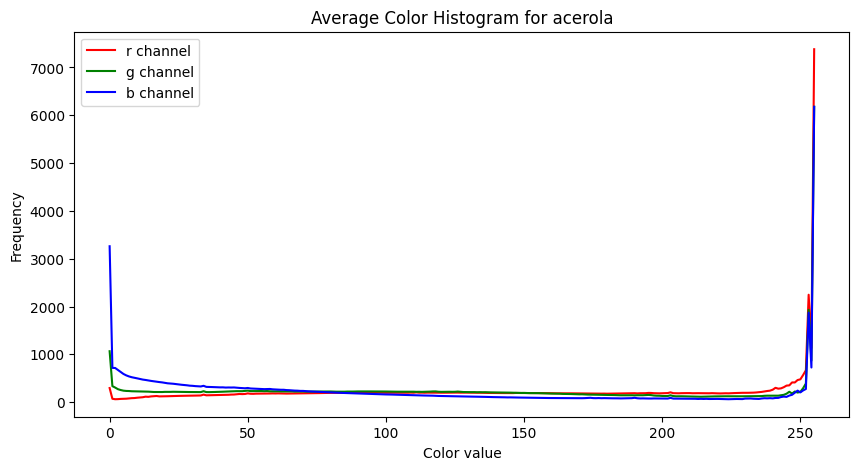

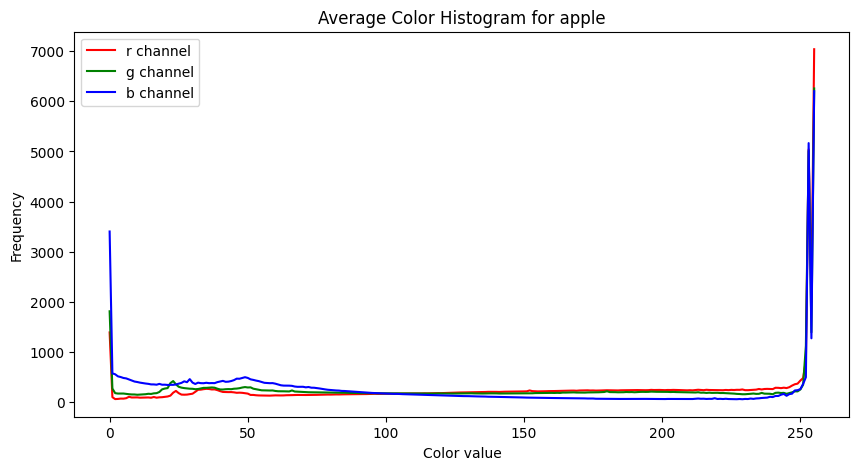

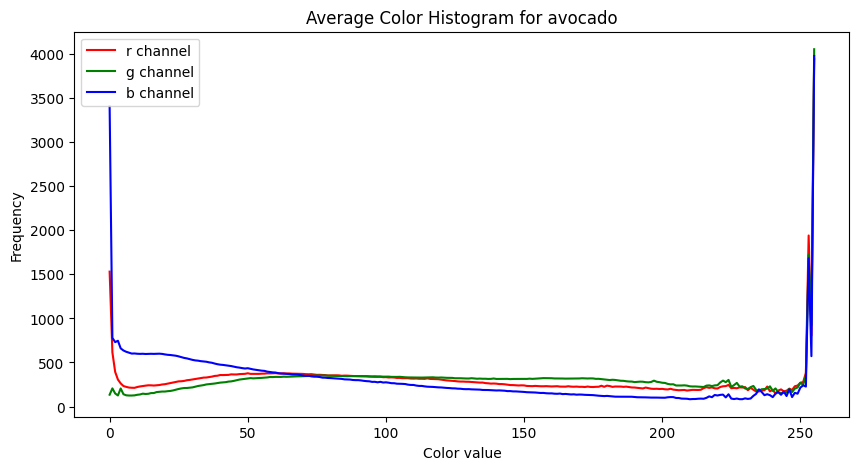

In [7]:
def fruit_color_histogram(dataset_path, fruit_classes):
    colors = ('r', 'g', 'b')
    channel_ids = (0, 1, 2)

    for fruit_class in fruit_classes:
        image_files = [os.path.join(dataset_path, fruit_class, file) for file in os.listdir(os.path.join(dataset_path, fruit_class))]
        histograms = []

        for img_path in image_files:
            img = Image.open(img_path)
            img_array = np.array(img)
            hist_channels = [np.histogram(img_array[:, :, i], bins=256, range=(0, 256))[0] for i in channel_ids]
            histograms.append(hist_channels)

        mean_histograms = np.mean(histograms, axis=0)

        plt.figure(figsize=(10, 5))
        plt.title(f'Average Color Histogram for {fruit_class}')
        for hist, color in zip(mean_histograms, colors):
            plt.plot(range(256), hist, color=color, label=f'{color} channel')

        plt.xlabel('Color value')
        plt.ylabel('Frequency')
        plt.legend()
        plt.show()

fruit_color_histogram(DATASET_PATH, CLASS_NAMES)

Kehadiran saluran biru yang mendominasi dalam histogram warna rata-rata untuk keempaat kelas buah memiliki beberapa kemungkinan penyebabnya:

1. **Variasi warna buah**: Masing-masing kelas buah mungkin memiliki variasi warna yang berbeda-beda, dan warna biru mungkin menjadi fitur yang lebih mendominasi dalam rata-rata warna buah tersebut. Misalnya, beberapa buah mungkin memiliki dominasi warna biru dalam bagian tertentu dari spektrum warna, seperti kulit atau daging buahnya.

2. **Pencahayaan atau Latar Belakang**: Warna biru seringkali muncul secara alami dalam pencahayaan atau latar belakang foto, terutama jika buah difoto di luar ruangan atau dalam pencahayaan alami. Ini dapat menyebabkan peningkatan kehadiran warna biru dalam rata-rata warna buah.

3. **Sifat Spektral Buah**: Beberapa buah memiliki sifat spektral yang dapat menyebabkan refleksi cahaya yang lebih tinggi pada saluran warna biru. Misalnya, beberapa buah memiliki pigmen yang cenderung memantulkan atau menyerap cahaya biru lebih banyak daripada warna lainnya.

4. **Metode Pengambilan Gambar**: Penggunaan perangkat fotografi atau pengaturan pencahayaan tertentu dalam proses pengambilan gambar buah dapat mempengaruhi bagaimana warna direkam dalam gambar. Metode ini dapat memberikan penekanan yang berbeda pada saluran warna tertentu, termasuk warna biru.

Namun, penting untuk diingat bahwa interpretasi ini akan lebih valid jika didukung oleh analisis lebih lanjut tentang dataset dan karakteristik masing-masing kelas buah yang terlibat.

Oleh karena itu, untuk meningkatkan visualisasi yang lebih detail, saya akan memberikan contoh color histogram untuk 1 image saja pada setiap fruit class

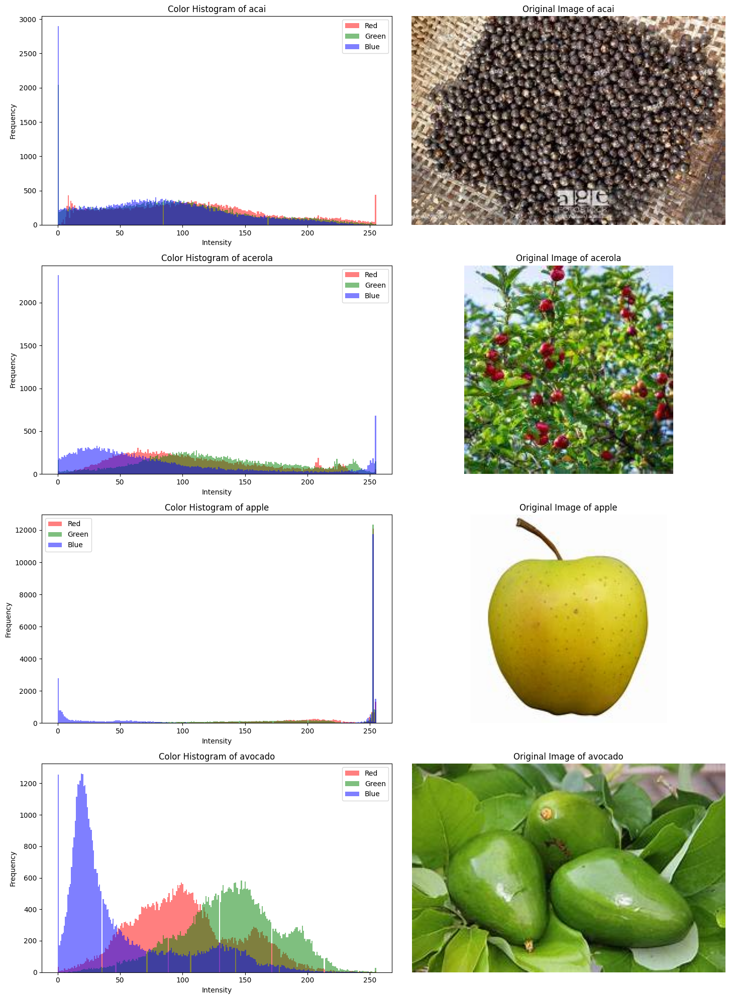

In [11]:
def color_histogram_with_images(fruit_class, dataset_path):
    fig, axs = plt.subplots(len(fruit_class), 2, figsize=(15, 5 * len(fruit_class)))  # Ubah ukuran figur dan jumlah subplot menjadi 2

    for i, fruit_name in enumerate(fruit_class):
        fruit_folder = os.path.join(dataset_path, fruit_name)
        image_files = os.listdir(fruit_folder)
        image_path = os.path.join(fruit_folder, image_files[0])
        image = Image.open(image_path)
        image_array = np.array(image)

        color_labels = ['Red', 'Green', 'Blue']
        colors = ['r', 'g', 'b']
        for j, (color, label) in enumerate(zip(colors, color_labels)):
            color_values = image_array[:,:,j].flatten()
            axs[i, 0].hist(color_values, bins=256, color=color, alpha=0.5, label=label)

        axs[i, 0].set_xlabel('Intensity')
        axs[i, 0].set_ylabel('Frequency')
        axs[i, 0].set_title(f'Color Histogram of {fruit_name}')
        axs[i, 0].legend()

        # Tampilkan gambar asli di sebelah histogram
        axs[i, 1].imshow(image)
        axs[i, 1].set_title(f'Original Image of {fruit_name}')
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

color_histogram_with_images(CLASS_NAMES, DATASET_PATH)

Berikut adalah beberapa penjelasan yang masuk akal untuk hasil histogram diatas:

1. **Class Acai**: Acai biasanya memiliki warna kulit yang gelap, yang dapat tercermin dalam dominasi warna biru dalam histogram. Selain itu, adanya warna hijau yang mungkin berasal dari daun dan lingkungan sekitarnya memberikan variasi dalam histogram.

2. **Class Acerola**: Persebaran yang merata antara warna merah, biru, dan hijau mungkin disebabkan oleh karakteristik buah acerola yang berwarna merah cerah. Warna hijau mungkin berasal dari daun dan lingkungan sekitarnya, sementara warna biru mungkin disebabkan oleh langit atau elemen latar belakang lainnya.

3. **Class Apple**: Apel memiliki variasi warna yang cukup, dari merah hingga kuning. Histogram yang merata antara warna biru, merah, dan hijau mencerminkan variasi ini. Pada gambar yang dianalisis, apel mungkin berwarna kuning, yang menghasilkan distribusi warna yang merata di ketiga saluran warna.

4. **Class Avocado**: Dominasi warna merah dan hijau dalam histogram mencerminkan warna utama kulit dan daging alpukat. Namun, lonjakan dalam intensitas warna biru pada nilai yang lebih rendah (0-50) mungkin disebabkan oleh variasi dalam tekstur atau pencahayaan gambar, atau mungkin ada elemen latar belakang yang memberikan kontribusi terhadap warna biru tersebut.

### Train/Val/Test Split + Resize Data (224x224)

In [7]:
# Path dataset baru untuk training, validation, dan test
TRAIN_PATH = "/content/drive/MyDrive/UTS/Dataset2/Train"
VAL_PATH = "/content/drive/MyDrive/UTS/Dataset2/Val"
TEST_PATH = "/content/drive/MyDrive/UTS/Dataset2/Test"

In [ ]:
# Fungsi untuk resize gambar
def resize_image(input_path, output_path, target_size):
    img = Image.open(input_path)
    img_resized = img.resize(target_size, Image.LANCZOS)
    img_resized.save(output_path)

# Pembagian data: 80% training, 10% validation, 10% test
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# Membuat direktori baru
for path in [TRAIN_PATH, VAL_PATH, TEST_PATH]:
    if not os.path.exists(path):
        os.makedirs(path)

# Looping untuk setiap kelas
for class_name in CLASS_NAMES:
    # Mengambil list semua file dalam kelas
    class_path = os.path.join(DATASET_PATH, class_name)
    files = os.listdir(class_path)
    random.shuffle(files)  # Acak urutan file

    # Menghitung jumlah file untuk masing-masing set
    num_files = len(files)
    num_train = int(train_ratio * num_files)
    num_val = int(val_ratio * num_files)

    # Memisahkan file ke dalam set
    train_files = files[:num_train]
    val_files = files[num_train:num_train + num_val]
    test_files = files[num_train + num_val:]

    # Memindahkan dan meresize gambar ke set masing-masing
    for filename in train_files:
        input_path = os.path.join(class_path, filename)
        output_path = os.path.join(TRAIN_PATH, class_name, filename)
        if not os.path.exists(os.path.join(TRAIN_PATH, class_name)):
            os.makedirs(os.path.join(TRAIN_PATH, class_name))
        resize_image(input_path, output_path, (224, 224))

    for filename in val_files:
        input_path = os.path.join(class_path, filename)
        output_path = os.path.join(VAL_PATH, class_name, filename)
        if not os.path.exists(os.path.join(VAL_PATH, class_name)):
            os.makedirs(os.path.join(VAL_PATH, class_name))
        resize_image(input_path, output_path, (224, 224))

    for filename in test_files:
        input_path = os.path.join(class_path, filename)
        output_path = os.path.join(TEST_PATH, class_name, filename)
        if not os.path.exists(os.path.join(TEST_PATH, class_name)):
            os.makedirs(os.path.join(TEST_PATH, class_name))
        resize_image(input_path, output_path, (224, 224))

In [8]:
for set_name, set_path in zip(["Train", "Val", "Test"], [TRAIN_PATH, VAL_PATH, TEST_PATH]):
    print(f"{set_name} set:")
    for class_name in CLASS_NAMES:
        num_images = len(os.listdir(os.path.join(set_path, class_name)))
        print(f"- {class_name}: {num_images} images")

Train set:
- acai: 320 images
- acerola: 320 images
- apple: 320 images
- avocado: 320 images
Val set:
- acai: 40 images
- acerola: 40 images
- apple: 40 images
- avocado: 40 images
Test set:
- acai: 40 images
- acerola: 40 images
- apple: 40 images
- avocado: 40 images


### 3.) Data Augmentation

In [9]:
# Inisialisasi ImageDataGenerator untuk augmentasi data
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=90,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.5, 1.5],
    channel_shift_range=50,
)

val_datagen = ImageDataGenerator(rescale=1.0/255)
test_datagen = ImageDataGenerator(rescale=1.0/255)

Data augmentation adalah teknik yang digunakan dalam pelatihan model machine learning, khususnya pada pengolahan citra, untuk meningkatkan keberagaman data pelatihan dengan membuat variasi baru dari data yang sudah ada. Hal ini bertujuan untuk mencegah overfitting dan meningkatkan generalisasi model.

Di atas adalah konfigurasi untuk `ImageDataGenerator` dalam Keras yang digunakan untuk melakukan data augmentation pada gambar.

1. **rescale**: Menormalkan intensitas piksel gambar menjadi rentang [0, 1] dengan membaginya dengan 255.

2. **rotation_range**: Range derajat rotasi dalam derajat untuk rotasi acak gambar.

3. **width_shift_range**: Range pergeseran horizontal dalam fraksi dari dimensi total gambar.

4. **height_shift_range**: Range pergeseran vertikal dalam fraksi dari dimensi total gambar.

5. **shear_range**: Range peregangan sudut dalam arah searah jarum jam dalam derajat.

6. **zoom_range**: Range zoom acak.

7. **horizontal_flip**: Bool, mengindikasikan apakah akan melakukan flip horizontal acak pada gambar.

8. **brightness_range**: Range untuk mengacaukan kecerahan gambar.

9. **channel_shift_range**: Range untuk mengacaukan saluran warna.

Dengan menggunakan kombinasi parameter-parameter ini, dapat dibuat variasi baru dari setiap gambar dalam dataset training. Misalnya, dengan melakukan rotasi, pergeseran, pergeseran, peregangan, zoom, flip horizontal, atau perubahan kecerahan, dapat membuat variasi baru yang memungkinkan model untuk mempelajari pola-pola yang lebih umum dan meningkatkan keandalan dan generalisasi model.

In [10]:
# Flow data dari direktori
train_generator = train_datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    VAL_PATH,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    TEST_PATH,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 1280 images belonging to 4 classes.
Found 160 images belonging to 4 classes.
Found 160 images belonging to 4 classes.


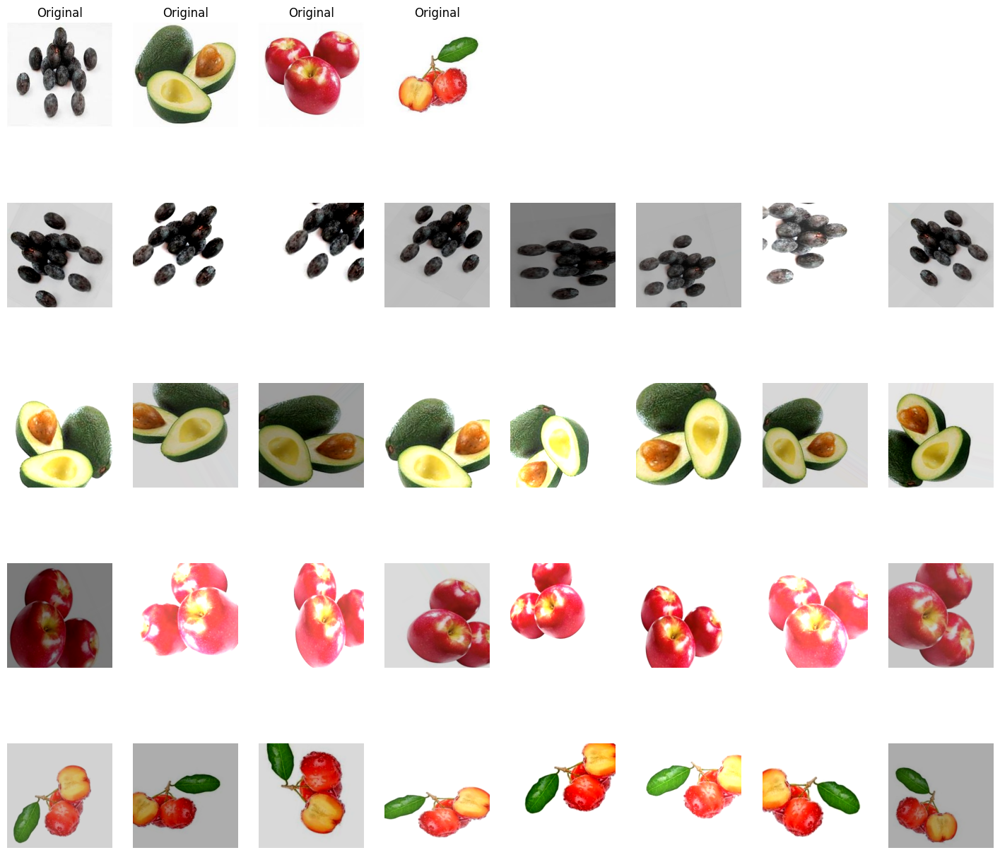

In [11]:
# Path untuk gambar sebelum augmentasi
image_paths = [
    "/content/drive/MyDrive/UTS/Dataset2/Train/acai/818.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Train/avocado/1162.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Train/apple/1191.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Train/acerola/1181.jpg"
]

# Tampilkan gambar sebelum augmentasi
plt.figure(figsize=(18, 16))  # Ubah ukuran gambar
for i, path in enumerate(image_paths):
    img = load_img(path, target_size=(224, 224))
    plt.subplot(5, 8, i + 1)  # Gunakan grid 5x8
    plt.imshow(img)
    plt.title("Original")
    plt.axis('off')

# Tampilkan gambar sesudah augmentasi
for j, path in enumerate(image_paths):  # Gunakan indeks dari enumerate
    img = load_img(path, target_size=(224, 224))
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)
    i = 0
    for batch in train_datagen.flow(x, batch_size=1):  # Gunakan train_datagen
        plt.subplot(5, 8, j * 8 + i + 9)  # Perhitungan indeks yang benar
        plt.imshow(batch[0])
        plt.axis('off')
        i += 1
        if i >= 8:
            break  # Stop setelah mengambil 8 gambar yang sudah di-augmentasi

plt.show()

## B.) Challenges and Difficulties

### 1.) Image Quality (Resolution, Noise)

Dalam konteks pengolahan data gambar, kualitas gambar memiliki peran penting dalam menentukan kinerja model. Dua aspek utama dari kualitas gambar yang sering menjadi tantangan adalah resolusi dan noise.

**A.) Resolution**

- Resolusi yang rendah pada gambar dapat menjadi tantangan karena detail yang penting mungkin tidak terlihat dengan jelas. Ini dapat mengakibatkan kesulitan dalam mengekstrak fitur-fitur yang diperlukan untuk klasifikasi yang akurat. Gambar yang buram atau kabur juga dapat menjadi masalah serius karena informasi yang hilang atau terdistorsi.
- Dalam kasus resolusi rendah, model mungkin kesulitan dalam membedakan detail halus antara kelas yang berbeda. Misalnya, pada gambar buah, detail seperti tekstur atau pola yang penting untuk klasifikasi mungkin tidak terlihat dengan jelas pada gambar yang beresolusi rendah. Hal ini dapat mengakibatkan model membuat prediksi yang tidak akurat atau kurang tepat.

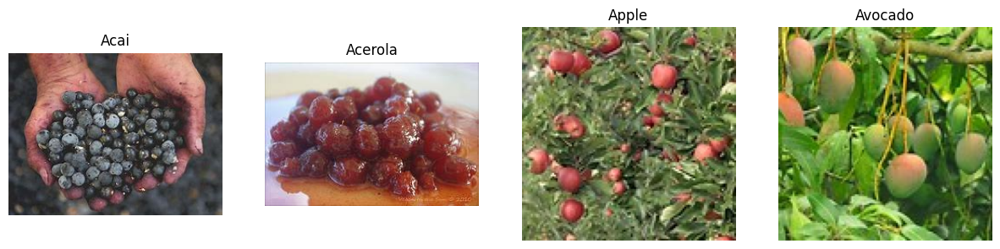

In [26]:
class_labels = ['Acai', 'Acerola', 'Apple', 'Avocado']
image_paths = [
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acai/23.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acerola/494.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/apple/35.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/avocado/10.jpg"
]

plt.figure(figsize=(15, 5))
for i, path in enumerate(image_paths):
    plt.subplot(1, 4, i + 1)
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.title(class_labels[i])
    plt.axis('off')
plt.show()

**B.) Noise**

- Noise atau gangguan pada gambar dapat mengaburkan informasi penting dan mengganggu proses ekstraksi fitur. Noise dapat berasal dari berbagai sumber, seperti sensor kamera, lingkungan pengambilan gambar, atau proses penyimpanan gambar. Tingkat noise yang tinggi dapat menyulitkan model dalam mengidentifikasi pola atau fitur yang relevan.
- Model yang sensitif terhadap noise mungkin mengalami kesulitan dalam membedakan sinyal yang relevan dari noise yang tidak relevan. Misalnya, dalam gambar buah, noise yang terlihat seperti bintik-bintik acak atau artefak pada gambar dapat mengaburkan bentuk atau warna buah yang sebenarnya. Hal ini dapat menyebabkan model membuat prediksi yang tidak akurat atau tidak konsisten.

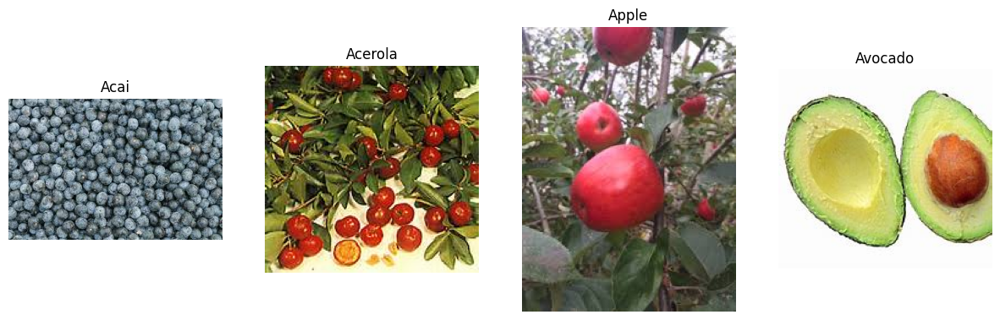

In [27]:
image_paths = [
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acai/455.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acerola/204.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/apple/544.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/avocado/2.jpg"
]

plt.figure(figsize=(15, 5))
for i, path in enumerate(image_paths):
    plt.subplot(1, 4, i + 1)
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.title(class_labels[i])
    plt.axis('off')
plt.show()

### 2.) Image Variability (Lighting Conditions, Perspective and Angle, Occlusions, Background Variability, Scale Variations)

Dalam konteks pengolahan data gambar, variasi gambar adalah tantangan utama yang sering dihadapi oleh model. Variasi ini dapat berasal dari berbagai sumber, termasuk kondisi pencahayaan, sudut pandang, occlusions, variasi latar belakang, dan variasi skala.

**A.) Lightning Condition**

- Perbedaan dalam kondisi pencahayaan, seperti pencahayaan yang terang atau redup, dapat menghasilkan variasi intensitas piksel yang signifikan dalam gambar. Hal ini dapat mengubah tampilan warna dan tekstur objek dalam gambar secara drastis.
- Model dapat mengalami kesulitan dalam memahami objek atau fitur dalam gambar ketika kondisi pencahayaan berbeda secara signifikan antara gambar-gambar dalam dataset. Misalnya, objek yang terkena bayangan kuat mungkin tampak berbeda dari objek yang terkena cahaya langsung, yang dapat menyulitkan model dalam klasifikasi.

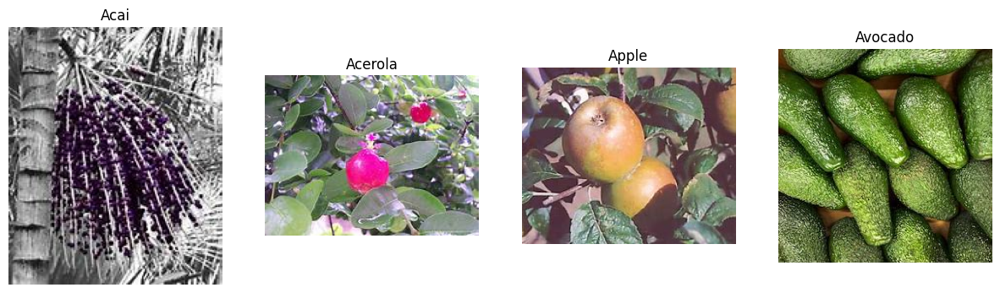

In [28]:
image_paths = [
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acai/141.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acerola/32.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/apple/256.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/avocado/638.jpg"
]

plt.figure(figsize=(15, 5))
for i, path in enumerate(image_paths):
    plt.subplot(1, 4, i + 1)
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.title(class_labels[i])
    plt.axis('off')
plt.show()

**B.) Perspective and Angle**

- Variasi sudut dan perspektif pengambilan gambar dapat menghasilkan perbedaan dalam tampilan objek, terutama dalam konteks objek tiga dimensi. Sudut pengambilan yang berbeda juga dapat menghasilkan perbedaan dalam proporsi dan konteks objek dalam gambar.
- Model mungkin kesulitan dalam menggeneralisasi fitur-fitur objek yang muncul dalam berbagai sudut dan perspektif. Misalnya, objek yang terlihat dari sudut yang berbeda mungkin memiliki tampilan yang sangat berbeda, yang dapat membingungkan model.

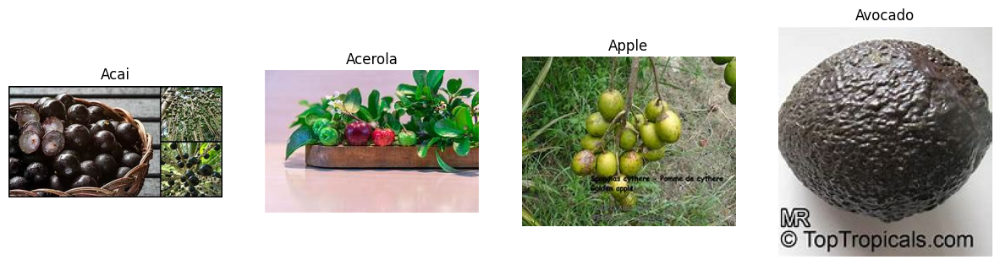

In [29]:
image_paths = [
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acai/975.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acerola/50.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/apple/1181.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/avocado/346.jpg"
]

plt.figure(figsize=(15, 5))
for i, path in enumerate(image_paths):
    plt.subplot(1, 4, i + 1)
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.title(class_labels[i])
    plt.axis('off')
plt.show()

**C.) Occlusions**

- Occlusions atau penyilangan objek dapat menyebabkan sebagian atau seluruh objek tersembunyi dalam gambar. Hal ini dapat menyebabkan hilangnya informasi penting tentang objek dan menyulitkan model dalam pengenalan objek.
- Model mungkin kesulitan dalam mengidentifikasi objek yang tersembunyi atau sebagian tersembunyi dalam gambar. Misalnya, dalam gambar buah yang sebagian tersembunyi oleh objek lain, model mungkin kesulitan dalam mengenali jenis buah yang sebenarnya.

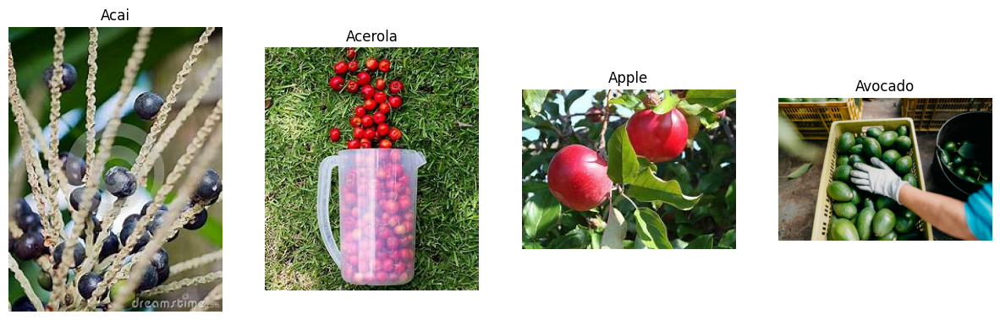

In [31]:
image_paths = [
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acai/122.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acerola/136.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/apple/936.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/avocado/488.jpg"
]

plt.figure(figsize=(15, 5))
for i, path in enumerate(image_paths):
    plt.subplot(1, 4, i + 1)
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.title(class_labels[i])
    plt.axis('off')
plt.show()

**D.) Background Variability**

- Latar belakang yang bervariasi dapat menyebabkan perubahan dalam konteks visual objek dalam gambar. Latar belakang yang rumit atau berisik juga dapat mengganggu perhatian model terhadap objek utama dalam gambar.
- Model mungkin kesulitan dalam membedakan objek dari latar belakang yang kompleks atau bervariasi. Misalnya, objek dengan warna atau tekstur yang mirip dengan latar belakang mungkin sulit untuk dibedakan oleh model.

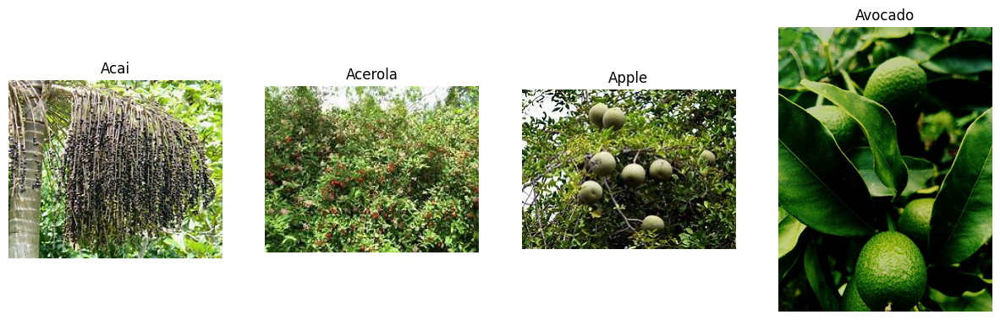

In [34]:
image_paths = [
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acai/71.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acerola/311.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/apple/375.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/avocado/429.jpg"
]

plt.figure(figsize=(15, 5))
for i, path in enumerate(image_paths):
    plt.subplot(1, 4, i + 1)
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.title(class_labels[i])
    plt.axis('off')
plt.show()

**E.) Scale Variations**

- Variasi dalam skala objek dalam gambar dapat menyebabkan perubahan dalam proporsi dan detail objek. Objek yang sama mungkin tampak berbeda dalam gambar-gambar dengan skala yang berbeda.
- Model mungkin kesulitan dalam menggeneralisasi fitur-fitur objek dalam berbagai skala. Misalnya, objek yang terlalu kecil atau terlalu besar dalam gambar mungkin sulit untuk dikenali atau diklasifikasikan dengan benar oleh model.

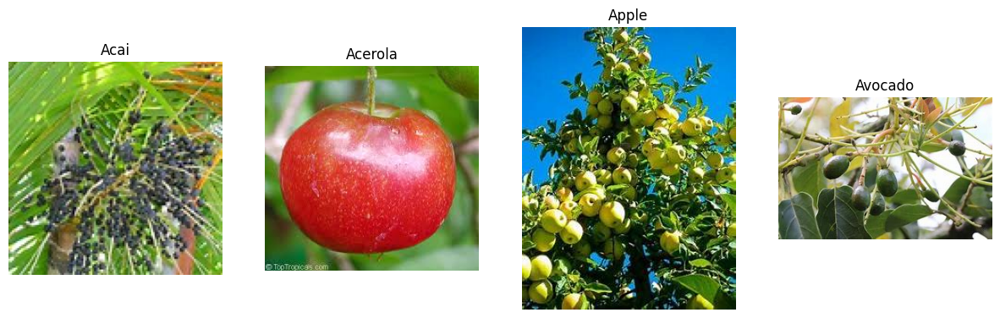

In [33]:
image_paths = [
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acai/53.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/acerola/34.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/apple/1143.jpg",
    "/content/drive/MyDrive/UTS/Dataset2/Dataset2A/avocado/119.jpg"
]

plt.figure(figsize=(15, 5))
for i, path in enumerate(image_paths):
    plt.subplot(1, 4, i + 1)
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.title(class_labels[i])
    plt.axis('off')
plt.show()

## C.) Baseline Architecture

Pada bagian ini, saya akan membuat arsitektur baseline dari stratch sesuai dengan gambar arsitektur VGG-16 yang disediakan di soal dengan menggunakan ReLU sebagai activation function tiap hidden layer. Selain itu, saya juga akan menjelaskan mengenai model pretained dari VGG-16 yang digunakan dan metode fine-tuning yang dilakukan.

In [ ]:
def VGG16_baseline(input_shape=(224, 224, 3), num_classes=4):
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    # Fully connected layers
    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dense(4096, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))

    return model

model = VGG16_baseline(input_shape=(224, 224, 3), num_classes=4)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 64)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 128)       0         
 g2D)                                                   

Model yang digunakan sebagai baseline architecture arsitektur VGG-16, yang merupakan salah satu arsitektur Convolutional Neural Network (CNN) yang sangat terkenal dan sering digunakan dalam bidang pengolahan citra. VGG-16 terdiri dari 16 lapisan (dihitung sebagai convolutional dan fully connected layers), dengan pola yang terdiri dari beberapa blok convolusi yang diikuti oleh lapisan max pooling.


Berikut penjelasan detail mengenai arsitektur VGG-16 yang telah dibuat:
1. **Convolutional Layers**:
- Setiap blok konvolusi terdiri dari beberapa lapisan konvolusi berturut-turut dengan kernel size (ukuran kernel) 3x3 dan fungsi aktivasi ReLU. Dalam contoh ini, saya menggunakan padding yang sama (padding='same'), yang berarti ukuran gambar akan dipertahankan setelah melewati lapisan konvolusi. Penggunaan padding ini membantu dalam mempertahankan informasi di border gambar. Misalnya, jika memiliki gambar input berukuran 224x224 dan menggunakan kernel 3x3 dengan padding yang sama, ukuran gambar akan tetap 224x224 setelah melewati lapisan konvolusi.
  - Convolutional Layer 1 (64 filter): Pada lapisan pertama, terdapat 64 filter yang diterapkan pada gambar input. Setiap filter ukurannya adalah 3x3. Filter ini bertujuan untuk mendeteksi fitur-fitur sederhana seperti tepi, sudut, dan pola-pola kecil lainnya.
  - Convolutional Layer 2 (128 filter): Pada lapisan kedua, jumlah filter meningkat menjadi 128. Dengan jumlah filter yang lebih besar, lapisan ini dapat mengekstraksi fitur-fitur yang lebih kompleks dari gambar input. Misalnya, filter ini dapat mendeteksi pola-pola yang lebih besar atau kombinasi dari pola-pola yang ditemukan pada lapisan sebelumnya.
  - Convolutional Layer 3 (256 filter): Lapisan ketiga memiliki 256 filter, yang semakin meningkatkan kapasitas model untuk mengekstraksi fitur-fitur yang kompleks dan abstrak dari gambar. Filter-filter ini dapat menangkap pola-pola yang semakin kompleks seperti tekstur, bentuk, dan detail-detail yang lebih halus.
  - Convolutional Layer 4 (512 filter): Pada lapisan keempat, jumlah filter kembali meningkat menjadi 512. Dengan jumlah filter yang lebih besar lagi, lapisan ini dapat menangkap fitur-fitur yang sangat kompleks dan abstrak dari gambar input. Filter-filter ini dapat mendeteksi pola-pola yang sangat spesifik dan kompleks, serta memungkinkan model untuk memahami gambar dengan lebih baik.
   
2. **Max Pooling Layers**:
  - Setelah setiap blok konvolusi, terdapat lapisan max pooling dengan ukuran pool (pool size) 2x2 dan strides (langkah) 2x2. Ini berarti jarak yang diambil oleh jendela pooling adalah 2x2, dan pooling dilakukan setiap pergeseran 2 piksel.
  - Dengan menggunakan ukuran pool 2x2 dan strides 2x2, dimensi spasial dari fitur-fitur yang telah dipelajari akan diurangi setengahnya setiap kali lapisan max pooling diterapkan. Hal ini membantu dalam mengurangi dimensi gambar, yang mengurangi jumlah parameter dan mempercepat komputasi.
  - Selain itu, max pooling juga membantu dalam mengurangi overfitting dengan melakukan down-sampling pada fitur-fitur yang paling dominan.

3. **Fully Connected Layers**:
  - Setelah beberapa blok konvolusi, terdapat lapisan-lapisan fully connected (dense layers) yang bertugas untuk melakukan klasifikasi berdasarkan fitur-fitur yang telah dipelajari sebelumnya.
  - Jumlah neuron pada lapisan-lapisan fully connected ditentukan oleh parameter yang diberikan (misalnya, 4096 neuron pada lapisan dense pertama).
  - Dalam kasus ini, memiliki lapisan output dengan jumlah neuron yang sama dengan jumlah kelas yang ingin diprediksi (dalam contoh ini, 4 kelas), dan menggunakan fungsi aktivasi softmax untuk menghasilkan probabilitas output untuk setiap kelas.

=================================================================================================================

Metode fine-tuning adalah sebuah teknik dalam transfer learning yang memungkinkan untuk menggunakan knowlegde yang telah dipelajari dari model yang sudah dilatih sebelumnya pada dataset besar (seperti ImageNet) dan mengadaptasikannya untuk dataset target yang lebih kecil.

Dalam kasus ini, meskipun saya tidak memiliki akses ke weight yang telah dilatih pada dataset ImageNet, saya masih dapat menerapkan konsep fine-tuning dengan menggunakan arsitektur VGG-16 sebagai titik awal.

Berikut adalah penjelasan tentang fine-tuning yang saya lakukan:
1. **Penggunaan Model Pretrained**: Saya menggunakan arsitektur VGG-16 sebagai model awal. Meskipun saya tidak memiliki weight yang dilatih dari dataset ImageNet, saya tetap dapat memanfaatkan struktur model VGG-16 untuk mengekstraksi fitur-fitur gambar yang kompleks.

2. **Pembekuan (Freeze) Beberapa Lapisan Awal**: Saya memilih untuk tidak membekukan lapisan-lapisan awal dari model VGG-16. Hal ini dikarenakan saya tidak memiliki weight yang dilatih, sehingga membiarkan semua lapisan terbuka untuk penyesuaian selama proses pelatihan. Dengan cara ini, model memiliki fleksibilitas untuk menyesuaikan representasi-fitur gambar yang lebih baik dengan dataset target fruit class ini.

3. **Melatih Kembali Lapisan-Lapisan Akhir (Fully Connected Layers)**: Saya menghapus lapisan output yang ada pada model VGG-16 dan menggantinya dengan lapisan-lapisan fully connected baru yang sesuai dengan jumlah kelas pada dataset target, yaitu 4 kelas buah: acai, acerola, apple, dan avocado. Lapisan-lapisan ini kemudian dilatih kembali dengan menggunakan dataset target.

Dengan melakukan fine-tuning seperti ini, memungkinkan model untuk menyesuaikan representasi-fitur yang telah dipelajari pada lapisan-lapisan konvolusi terhadap dataset target. Meskipun saya tidak menggunakan weight yang dilatih dari dataset ImageNet, saya masih dapat memanfaatkan struktur dan konsep dari arsitektur VGG-16 untuk meningkatkan kinerja model Anda dalam memecahkan masalah klasifikasi pada dataset buah yang lebih kecil.

In [ ]:
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Training model
history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=10,
    validation_data=val_generator,
    validation_steps=len(val_generator)
)

Epoch 1/10
40/40 [==============================] - 51s 642ms/step - loss: 1.3944 - accuracy: 0.2289 - val_loss: 1.3863 - val_accuracy: 0.2500
Epoch 2/10
40/40 [==============================] - 25s 624ms/step - loss: 1.3869 - accuracy: 0.2500 - val_loss: 1.3863 - val_accuracy: 0.2500
Epoch 3/10
40/40 [==============================] - 27s 659ms/step - loss: 1.3866 - accuracy: 0.2531 - val_loss: 1.3863 - val_accuracy: 0.2500
Epoch 4/10
40/40 [==============================] - 26s 644ms/step - loss: 1.3866 - accuracy: 0.2469 - val_loss: 1.3863 - val_accuracy: 0.2500
Epoch 5/10
40/40 [==============================] - 26s 648ms/step - loss: 1.3868 - accuracy: 0.2430 - val_loss: 1.3863 - val_accuracy: 0.2500
Epoch 6/10
40/40 [==============================] - 26s 656ms/step - loss: 1.3864 - accuracy: 0.2172 - val_loss: 1.3863 - val_accuracy: 0.2500
Epoch 7/10
40/40 [==============================] - 26s 653ms/step - loss: 1.3864 - accuracy: 0.2383 - val_loss: 1.3863 - val_accuracy: 0.2500

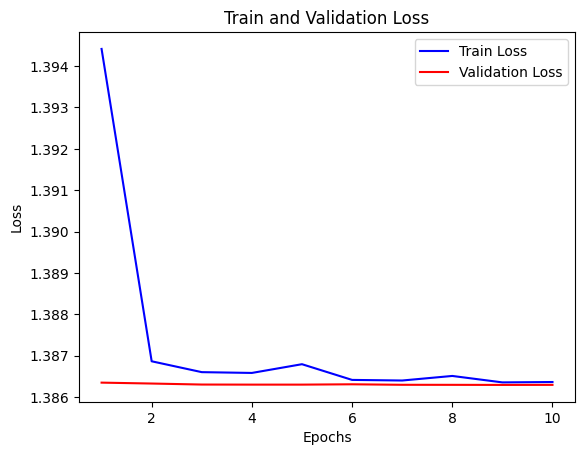

In [ ]:
# Ambil nilai train loss dan validation loss dari history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot train loss dan validation loss
epochs = range(1, len(train_loss) + 1)
plt.plot(epochs, train_loss, 'b', label='Train Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Dari hasil training yang diatas, terlihat bahwa baik train loss maupun validation loss stagnan di sekitar nilai yang tinggi sepanjang seluruh epoch, sementara akurasi juga stagnan di sekitar 25%.

Insight yang dapat diperoleh dari hasil ini adalah:
Penyebab train loss dan validation loss yang tetap pada nilai yang tinggi bisa berasal dari beberapa faktor, dan setiap faktor memerlukan pendekatan yang berbeda dalam penyelesaiannya. Berikut adalah beberapa kemungkinan penyebab dan solusi yang mungkin:

1. **Kekurangan Data:**
   - Dataset yang tersedia sangat kecil sehingga model mungkin kesulitan mempelajari pola yang relevan. Kekurangan data dapat menyebabkan model overfitting pada sampel training yang terbatas.
   - Langkah yang dapat diambil adalah dengan mengumpulkan lebih banyak data jika memungkinkan. Jika itu tidak memungkinkan, teknik augmentasi data seperti rotasi, pergeseran, dan flipping gambar dapat digunakan untuk menciptakan variasi tambahan dalam dataset Anda.

2. **Kompleksitas Model yang Tidak Memadai:**
   - Model baseline diatas mungkin masih terlalu sederhana sehingga tidak mampu menangkap kompleksitas dari data yang diberikan.
   - Langkah yang dapat diambil adalah mencoba menyesuaikan arsitektur model, menambahkan lebih banyak layer atau unit ke model. Namun, tetap harus memastikan untuk memperhatikan ukuran dataset dan menghindari overfitting dengan menggunakan teknik regularisasi seperti dropout.

3. **Masalah dalam Konfigurasi training:**
   - Parameter training seperti learning rate, batch size, dan jumlah epoch mungkin tidak diatur dengan baik.
   - Langkah yang dapat diambil adalah mencoba eksperimen dengan berbagai nilai untuk parameter training tersebut. Misalnya, coba kurangi learning rate, gunakan teknik penjadwalan learning rate, atau pertimbangkan untuk menggunakan optimasi lainnya selain Adam. Selain itu, mungkin perlu mengatur ulang strategi penggunaan augmentation dan proses preprocessing data untuk meningkatkan kinerja training model.

In [ ]:
# Prediksi kelas
y_pred = model.predict(test_generator)
predicted_classes = np.argmax(y_pred, axis=1)

# Evaluasi metrik
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_classes, predicted_classes, target_names=class_labels))

5/5 [==============================] - 1s 174ms/step
              precision    recall  f1-score   support

        acai       0.00      0.00      0.00        40
     acerola       0.25      1.00      0.40        40
       apple       0.00      0.00      0.00        40
     avocado       0.00      0.00      0.00        40

    accuracy                           0.25       160
   macro avg       0.06      0.25      0.10       160
weighted avg       0.06      0.25      0.10       160



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## D.) Architecture Modification

### Model 2

Pada bagian ini, saya akan melakukan modifikasi pada arsitektur VGG-16 di atas agar mendapatkan hasil klasifikasi yang optimal dengan beberapa tuning model tambahan.

Berikut adalah modifikasi yang akan saya lakukan pada arsitektur baseline VGG-16 untuk meningkatkan kinerjanya:
1. Tambahkan Batch Normalization:
Batch normalization dapat membantu dalam mempercepat pelatihan dan mencegah overfitting dengan menstabilkan distribusi nilai dalam setiap batch.
2. Tambahkan Dropout:
Dropout adalah teknik regularisasi yang efektif untuk mengurangi overfitting dengan secara acak mematikan sebagian unit dalam lapisan selama pelatihan.

Kedua hal tersebut masih bagian dari arsitektur model dan dianggap sebagai hyperparameter internal yang ditentukan sebagai bagian dari desain model

In [ ]:
def modified_vgg16(input_shape=(224, 224, 3), num_classes=4):
    model = Sequential()

    model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))

    return model

In [ ]:
model2 = modified_vgg16()
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history2 = model2.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=10,
    validation_data=val_generator,
    validation_steps=len(val_generator)
)

Epoch 1/10
40/40 [==============================] - 41s 777ms/step - loss: 31.7171 - accuracy: 0.4250 - val_loss: 117.1694 - val_accuracy: 0.3250
Epoch 2/10
40/40 [==============================] - 32s 791ms/step - loss: 5.5806 - accuracy: 0.5422 - val_loss: 15.0697 - val_accuracy: 0.2625
Epoch 3/10
40/40 [==============================] - 32s 781ms/step - loss: 3.8449 - accuracy: 0.5813 - val_loss: 6.2965 - val_accuracy: 0.2438
Epoch 4/10
40/40 [==============================] - 31s 750ms/step - loss: 2.3940 - accuracy: 0.6203 - val_loss: 31.1291 - val_accuracy: 0.2500
Epoch 5/10
40/40 [==============================] - 30s 753ms/step - loss: 2.3319 - accuracy: 0.6055 - val_loss: 1.5285 - val_accuracy: 0.3562
Epoch 6/10
40/40 [==============================] - 40s 979ms/step - loss: 1.6400 - accuracy: 0.6305 - val_loss: 2.8307 - val_accuracy: 0.3750
Epoch 7/10
40/40 [==============================] - 44s 1s/step - loss: 1.1396 - accuracy: 0.6672 - val_loss: 2.3662 - val_accuracy: 0.30

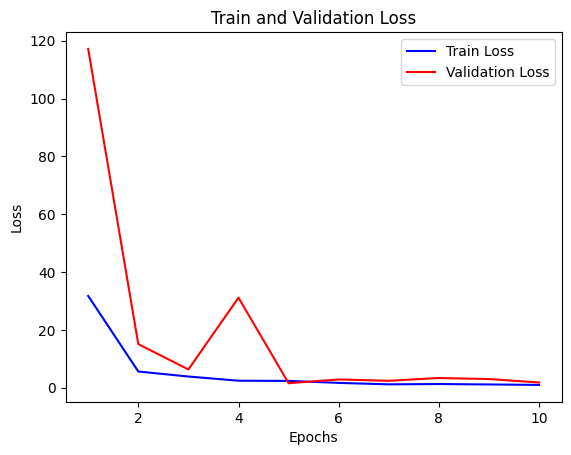

In [ ]:
# Ambil nilai train loss dan validation loss dari history
train_loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']

# Plot train loss dan validation loss
epochs = range(1, len(train_loss2) + 1)
plt.plot(epochs, train_loss2, 'b', label='Train Loss')
plt.plot(epochs, val_loss2, 'r', label='Validation Loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Dari hasil training model modifikasi diatas, terdapat beberapa insight yang dapat diperoleh:

1. **Kinerja Model:**
   - Terjadi peningkatan kinerja model dibandingkan dengan model sebelumnya. Akurasi pada data training dan validasi meningkat seiring dengan penurunan nilai loss.
   - Pada akhir training, akurasi pada data training mencapai sekitar 70% sedangkan akurasi pada data validasi sekitar 50%. Meskipun terdapat perbedaan antara akurasi pada data training dan validasi, namun selisihnya tidak signifikan, yang menunjukkan bahwa model tidak mengalami overfitting yang berlebihan.

2. **Tingkat Kegagalan Pada Data Validasi:**
   - Meskipun akurasi pada data validasi meningkat, namun masih terdapat tingkat kegagalan yang signifikan, terutama pada beberapa epoch awal. Hal ini menunjukkan bahwa model belum sepenuhnya mampu memahami pola-pola yang ada pada data validasi.

3. **Evaluasi Berdasarkan Metric Loss dan Accuracy:**
   - Metric loss menunjukkan bahwa terjadi penurunan signifikan pada loss setiap epoch, yang menunjukkan bahwa model berhasil belajar dari data training.
   - Meskipun terdapat peningkatan pada akurasi, namun masih terdapat ruang untuk peningkatan lebih lanjut, terutama pada data validasi.

4. **Perluasan dan Penyesuaian Model:**
   - Meskipun terdapat peningkatan kinerja, namun masih terdapat ruang untuk perbaikan lebih lanjut. Peningkatan kinerja dapat dicapai melalui penyesuaian lebih lanjut pada arsitektur model, peningkatan ukuran dataset, atau penyesuaian parameter training.
   - Selanjutnya, perlu dilakukan eksperimen lebih lanjut untuk menemukan kombinasi arsitektur, preprocessing data, dan parameter training yang optimal untuk mendapatkan hasil yang lebih baik lagi.

In [ ]:
# Prediksi kelas
y_pred2 = model2.predict(test_generator)
predicted_classes2 = np.argmax(y_pred2, axis=1)

# Evaluasi metrik
true_classes2 = test_generator.classes
class_labels2 = list(test_generator.class_indices.keys())

print(classification_report(true_classes2, predicted_classes2, target_names=class_labels2))

5/5 [==============================] - 2s 418ms/step
              precision    recall  f1-score   support

        acai       0.00      0.00      0.00        40
     acerola       0.62      0.25      0.36        40
       apple       0.46      0.65      0.54        40
     avocado       0.43      0.95      0.59        40

    accuracy                           0.46       160
   macro avg       0.38      0.46      0.37       160
weighted avg       0.38      0.46      0.37       160



### Model 3

Dalam upaya meningkatkan kinerja arsitektur baseline VGG-16 sebelumnya, saya akan melakukan beberapa modifikasi arsitektur dan hyperparameter tuning.
1. Menambahkan layer Conv2D dengan filter 1024, yang memberikan model lebih banyak kapasitas untuk mengekstraksi fitur yang kompleks dari gambar.
2. Meningkatkan jumlah **epochs menjadi 20** agar model memiliki lebih banyak kesempatan untuk belajar dari data pelatihan.
3. Menggunakan **Learning Rate Scheduler** (lr_scheduler) untuk menyesuaikan learning rate secara otomatis selama pelatihan, yang dapat membantu mempercepat konvergensi model.
4. Menggunakan **Early Stopping** untuk menghentikan pelatihan jika tidak terjadi peningkatan dalam kinerja model pada set validasi, sehingga mencegah overfitting.

In [12]:
def modified_vgg16_2nd(input_shape=(224, 224, 3), num_classes=4):
    model = Sequential()

    model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(1024, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(1024, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(1024, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))

    return model

In [ ]:
model3 = modified_vgg16_2nd()
model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Inisialisasi callback ReduceLROnPlateau
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1, min_lr=1e-6)
# Inisialisasi callback EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history3 = model3.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=20,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping, lr_scheduler]
)

Epoch 1/20
40/40 [==============================] - 45s 833ms/step - loss: 16.1553 - accuracy: 0.3414 - val_loss: 1400.7068 - val_accuracy: 0.2500 - lr: 0.0010
Epoch 2/20
40/40 [==============================] - 33s 808ms/step - loss: 4.1996 - accuracy: 0.4523 - val_loss: 36.3565 - val_accuracy: 0.2500 - lr: 0.0010
Epoch 3/20
40/40 [==============================] - 33s 817ms/step - loss: 3.2243 - accuracy: 0.4133 - val_loss: 2.8882 - val_accuracy: 0.2438 - lr: 0.0010
Epoch 4/20
40/40 [==============================] - 33s 814ms/step - loss: 1.7646 - accuracy: 0.5242 - val_loss: 2.7143 - val_accuracy: 0.3250 - lr: 0.0010
Epoch 5/20
40/40 [==============================] - 33s 808ms/step - loss: 1.3820 - accuracy: 0.5922 - val_loss: 4.2840 - val_accuracy: 0.2688 - lr: 0.0010
Epoch 6/20
40/40 [==============================] - 32s 800ms/step - loss: 1.1688 - accuracy: 0.6289 - val_loss: 1.9154 - val_accuracy: 0.4187 - lr: 0.0010
Epoch 7/20
40/40 [==============================] - 32s 785

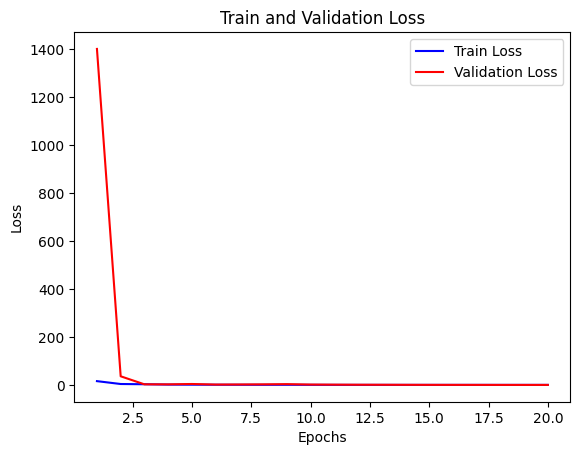

In [ ]:
# Ambil nilai train loss dan validation loss dari history
train_loss3 = history3.history['loss']
val_loss3 = history3.history['val_loss']

# Plot train loss dan validation loss
epochs = range(1, len(train_loss3) + 1)
plt.plot(epochs, train_loss3, 'b', label='Train Loss')
plt.plot(epochs, val_loss3, 'r', label='Validation Loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Saya akan melakukan zoom pada Loss range 0 hingga 20 untuk memperjelas Train Loss dan Validatin Loss

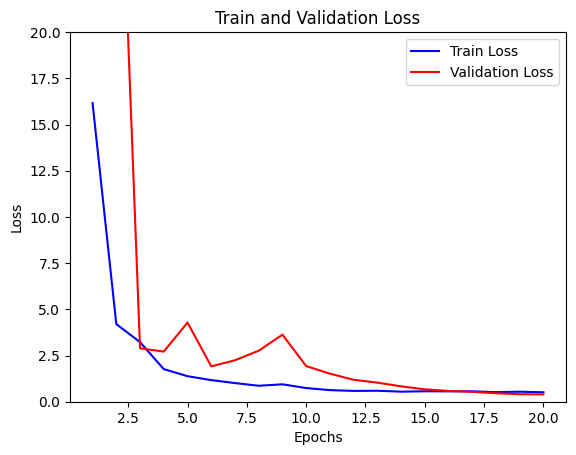

In [ ]:
epochs = range(1, len(train_loss3) + 1)
plt.plot(epochs, train_loss3, 'b', label='Train Loss')
plt.plot(epochs, val_loss3, 'r', label='Validation Loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0, 20)
plt.legend()
plt.show()

Dari hasil model ketiga, terlihat bahwa performa model secara keseluruhan meningkat secara signifikan dibandingkan dengan model kedua dan pertama. Beberapa poin yang menonjol dari perbandingan tersebut adalah:

1. **Loss Menurun dengan Signifikan**: Terlihat bahwa train loss dan validation loss menurun secara drastis dari epoch ke epoch. Hal ini menunjukkan bahwa model dapat dengan efektif mempelajari pola-pola yang ada dalam data pelatihan dan menerapkan pengetahuannya dengan baik pada data validasi.

2. **Akurasi yang Lebih Tinggi**: Akurasi pada set validasi juga meningkat secara konsisten seiring dengan penurunan loss. Pada akhirnya, akurasi mencapai nilai yang jauh lebih tinggi (sekitar 88.75%) dibandingkan dengan model sebelumnya. Hal ini menunjukkan bahwa model mampu melakukan klasifikasi dengan lebih baik.

3. **Penambahan Layer**: Penambahan layer Conv2D dengan filter 1024 pada model ketiga memberikan model lebih banyak kapasitas untuk mengekstraksi fitur yang kompleks dari gambar. Dengan demikian, model dapat belajar pola-pola yang lebih abstrak dan mendetail dari data.

4. **Penambahan Epochs**: Dengan meningkatkan jumlah epochs menjadi 20, model memiliki lebih banyak kesempatan untuk belajar dari data pelatihan. Hal ini memungkinkan model untuk menyesuaikan bobotnya dengan lebih baik, yang pada gilirannya mengarah pada peningkatan kinerja.

5. **Penggunaan Learning Rate Scheduler (lr_scheduler)**:
Dalam model ketiga, kita menggunakan ReduceLROnPlateau sebagai Learning Rate Scheduler. Ketika model tidak mengalami penurunan val_loss setelah beberapa epochs, ReduceLROnPlateau akan mengurangi learning rate agar model dapat mengambil langkah yang lebih kecil untuk mencapai minimum global val_loss. Ini membantu model untuk menghindari overshooting atau melampaui minimum global.

6. **Penggunaan Early Stopping**:
Early Stopping digunakan dalam model ketiga untuk menghentikan pelatihan lebih awal jika tidak ada peningkatan kinerja pada set validasi. Hal ini membantu mencegah overfitting dan memastikan bahwa model berhenti pada titik di mana kinerjanya masih optimal pada data validasi. Dengan menghentikan pelatihan saat tidak ada peningkatan yang signifikan, kita dapat mencegah model dari mempelajari noise atau variabilitas yang tidak relevan dalam data pelatihan.

Kombinasi dari Learning Rate Scheduler dan Early Stopping membantu model untuk belajar dengan efisien dan mencegahnya dari overfitting. Dengan mengurangi learning rate saat model sudah mendekati minimum global val_loss dan menghentikan pelatihan saat tidak ada peningkatan yang signifikan pada kinerja model, kita dapat menghasilkan model yang lebih baik dan lebih umum dalam melakukan klasifikasi gambar untuk kelas ['acai', 'acerola', 'apple', 'avocado'].

In [ ]:
# Prediksi kelas
y_pred3 = model3.predict(test_generator)
predicted_classes3 = np.argmax(y_pred3, axis=1)

# Evaluasi metrik
true_classes3 = test_generator.classes
class_labels3 = list(test_generator.class_indices.keys())

print(classification_report(true_classes3, predicted_classes3, target_names=class_labels3))

5/5 [==============================] - 2s 224ms/step
              precision    recall  f1-score   support

        acai       0.83      1.00      0.91        40
     acerola       0.80      0.60      0.69        40
       apple       0.58      0.62      0.60        40
     avocado       0.77      0.75      0.76        40

    accuracy                           0.74       160
   macro avg       0.75      0.74      0.74       160
weighted avg       0.75      0.74      0.74       160



### Model 4

Dalam upaya meningkatkan kinerja arsitektur baseline VGG-16 pada ketiga model sebelumnya, terdapat dua penambahan signifikan yang dilakukan:

1. Penambahan Fully Connected (FC) layer menjadi 8192.
  - Penambahan FC layer menjadi 8192 dengan harapan untuk memberikan model lebih banyak kapasitas atau ruang untuk mengekstraksi dan mempelajari fitur-fitur yang kompleks dari data gambar.
  - Dengan memperluas jumlah unit atau neuron dalam FC layer, model memiliki lebih banyak kemampuan untuk menangkap dan memahami pola-pola yang lebih rumit dalam data.
  - Hal ini diharapkan dapat meningkatkan kemampuan model untuk melakukan klasifikasi dengan lebih baik, terutama dalam membedakan antara kelas-kelas yang memiliki perbedaan fitur yang lebih halus dan kompleks.

2. Peningkatan jumlah epoch menjadi 50 dari sebelumnya 20.
  - Peningkatan jumlah epoch menjadi 50 dari sebelumnya 20 dilakukan untuk memberikan model lebih banyak kesempatan untuk belajar dari data pelatihan.
  - Dengan memperpanjang proses pelatihan, model memiliki waktu yang lebih lama untuk menyesuaikan bobotnya agar lebih tepat dan akurat.
  - Hal Ini dapat membantu dalam meningkatkan performa model secara keseluruhan dengan mengurangi kemungkinan underfitting dan meningkatkan kemampuan model untuk menangkap pola-pola yang lebih rumit dan abstrak dalam data.

In [19]:
def modified_vgg16_3nd(input_shape=(224, 224, 3), num_classes=4):
    model = Sequential()

    model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(1024, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(1024, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(1024, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(8192, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))

    return model

In [22]:
model4 = modified_vgg16_3nd()
model4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [23]:
# Inisialisasi callback ReduceLROnPlateau
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1, min_lr=1e-6)
# Inisialisasi callback EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [24]:
history4 = model4.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping, lr_scheduler]
)

Epoch 1/50
40/40 [==============================] - 45s 878ms/step - loss: 11.3592 - accuracy: 0.2766 - val_loss: 34.9218 - val_accuracy: 0.2375 - lr: 0.0010
Epoch 2/50
40/40 [==============================] - 35s 864ms/step - loss: 1.5306 - accuracy: 0.3922 - val_loss: 1.6765 - val_accuracy: 0.2875 - lr: 0.0010
Epoch 3/50
40/40 [==============================] - 34s 847ms/step - loss: 1.1597 - accuracy: 0.5156 - val_loss: 2.1004 - val_accuracy: 0.2625 - lr: 0.0010
Epoch 4/50
40/40 [==============================] - 33s 817ms/step - loss: 1.0702 - accuracy: 0.5109 - val_loss: 1.9850 - val_accuracy: 0.2750 - lr: 0.0010
Epoch 5/50
40/40 [==============================] - ETA: 0s - loss: 1.0531 - accuracy: 0.5625
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
40/40 [==============================] - 34s 832ms/step - loss: 1.0531 - accuracy: 0.5625 - val_loss: 2.0740 - val_accuracy: 0.2500 - lr: 0.0010
Epoch 6/50
40/40 [==============================] - 34s 84

Dari hasil training model keempat, terdapat beberapa perubahan dan peningkatan yang patut diperhatikan:

1. **Loss dan Akurasi**: Terjadi fluktuasi pada loss dan akurasi baik pada data pelatihan maupun data validasi selama proses training. Meskipun akurasi pada awalnya meningkat, namun pada beberapa epoch kemudian, terjadi penurunan akurasi diikuti dengan peningkatan loss. Ini menunjukkan bahwa model tidak stabil dan cenderung mengalami overfitting.

2. **Learning Rate Scheduler**: Penggunaan learning rate scheduler berhasil mengurangi learning rate secara otomatis saat penurunan val_loss telah berhenti untuk beberapa epochs, namun fluktuasi yang terjadi pada loss dan akurasi menunjukkan bahwa penyesuaian learning rate tersebut mungkin tidak cukup efektif.

3. **Early Stopping**: Callback early stopping berhasil menghentikan proses pelatihan lebih awal saat val_loss tidak menunjukkan penurunan selama beberapa epochs. Namun, meskipun early stopping telah diaktifkan, model masih mengalami fluktuasi yang signifikan dalam performanya.

4. **Penambahan Layer dan Epoch**: Penambahan layer dan epochs tidak secara langsung menghasilkan peningkatan kinerja yang diharapkan. Model tampaknya mengalami kesulitan dalam menggeneralisasi pola-pola yang kompleks dalam data pelatihan ke data validasi.

Dengan demikian, meskipun telah dilakukan modifikasi pada arsitektur model, penambahan layer, peningkatan epochs, serta penggunaan learning rate scheduler dan early stopping, model masih belum mampu memberikan peningkatan yang signifikan dalam performanya.

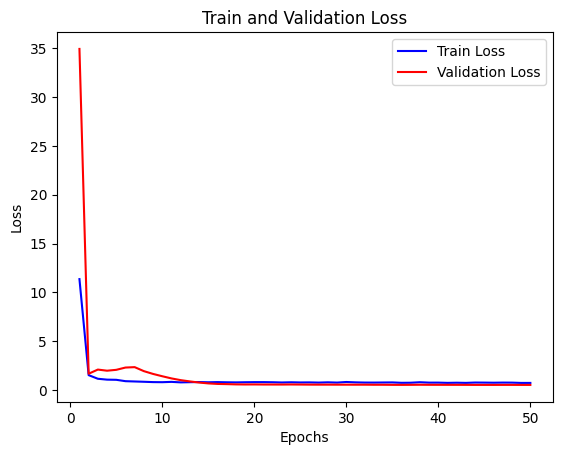

In [37]:
# Ambil nilai train loss dan validation loss dari history
train_loss4 = history4.history['loss']
val_loss4 = history4.history['val_loss']

# Plot train loss dan validation loss
epochs = range(1, len(train_loss4) + 1)
plt.plot(epochs, train_loss4, 'b', label='Train Loss')
plt.plot(epochs, val_loss4, 'r', label='Validation Loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [38]:
# Prediksi kelas
y_pred4 = model4.predict(test_generator)
predicted_classes4 = np.argmax(y_pred4, axis=1)

# Evaluasi metrik
true_classes4 = test_generator.classes
class_labels4 = list(test_generator.class_indices.keys())

print(classification_report(true_classes4, predicted_classes4, target_names=class_labels4))

5/5 [==============================] - 48s 12s/step
              precision    recall  f1-score   support

        acai       0.83      0.97      0.90        40
     acerola       0.57      0.70      0.63        40
       apple       0.43      0.07      0.13        40
     avocado       0.61      0.88      0.72        40

    accuracy                           0.66       160
   macro avg       0.61      0.66      0.59       160
weighted avg       0.61      0.66      0.59       160



# E.) Evaluation

Pada bagian ini, saya akan melakukan evaluasi performa dari arsitektur nomor 2d dan menjelaskan hasil yang didapatkan.

In [45]:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()

Saving ModelEvaluation.png to ModelEvaluation.png


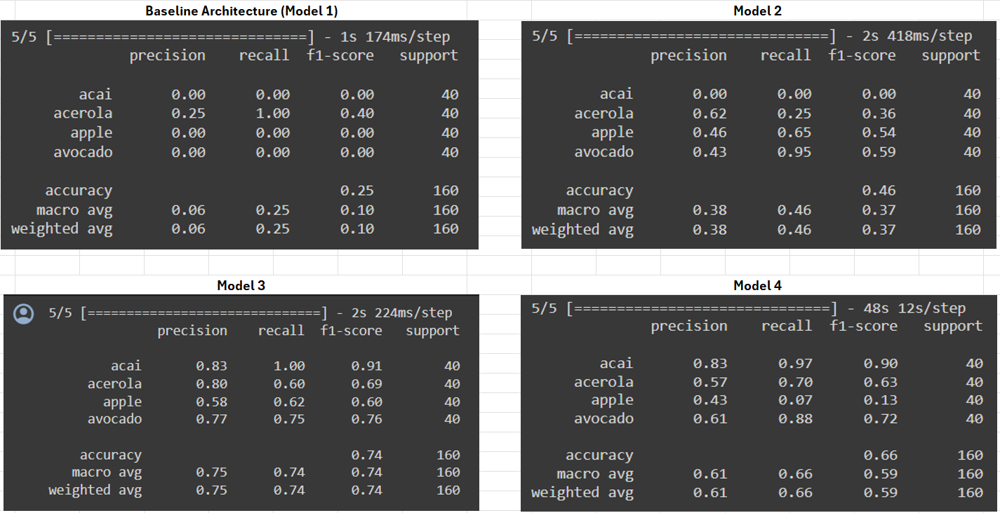

In [46]:
Image('ModelEvaluation.png')

Dari hasil evaluasi pada keempat model, diperoleh model 3 sebagai model terbaik dan model 4 sebagai model terbaik kedua. Terdapat perbedaan yang signifikan dalam performa klasifikasi antara Model 3 dan Model 4.

### Model 3:
- **Precision**: Model 3 mencapai presisi yang cukup tinggi untuk kelas 'acai' (0.83) dan 'acerola' (0.80), yang menunjukkan bahwa model memiliki kemampuan untuk mengidentifikasi kelas-kelas ini dengan tepat. Namun, presisi untuk kelas 'apple' (0.58) dan 'avocado' (0.77) cenderung lebih rendah, yang mengindikasikan bahwa ada kesulitan dalam menghindari false positive untuk kelas-kelas ini.
- **Recall**: Model 3 memiliki recall yang seimbang untuk kelas 'acai' (1.00) dan 'avocado' (0.75), yang menunjukkan bahwa model mampu menangkap sebagian besar sampel positif untuk kelas-kelas ini. Namun, recall untuk kelas 'acerola' (0.60) dan 'apple' (0.62) sedikit lebih rendah, menunjukkan bahwa model mungkin melewatkan beberapa sampel positif untuk kelas-kelas ini.
- **F1-Score**: F1-score untuk kelas 'acai' (0.91) dan 'avocado' (0.76) cukup tinggi, menunjukkan keseimbangan yang baik antara presisi dan recall. Namun, F1-score untuk kelas 'acerola' (0.69) dan 'apple' (0.60) lebih rendah, menunjukkan adanya kesulitan dalam menangkap keseimbangan yang optimal antara presisi dan recall untuk kelas-kelas ini.
- **Accuracy**: Akurasi keseluruhan model adalah 0.74, yang menunjukkan tingkat keakuratan dalam melakukan klasifikasi keseluruhan.

### Model 4:
- **Precision**: Model 4 juga mencapai presisi yang cukup tinggi untuk kelas 'acai' (0.83) dan 'avocado' (0.61), namun presisi untuk kelas 'acerola' (0.57) dan 'apple' (0.43) lebih rendah.
- **Recall**: Recall untuk kelas 'acai' (0.97) dan 'avocado' (0.88) cukup tinggi, menunjukkan kemampuan model untuk menangkap sebagian besar sampel positif untuk kelas-kelas ini. Namun, recall untuk kelas 'acerola' (0.70) dan 'apple' (0.07) jauh lebih rendah.
- **F1-Score**: F1-score untuk kelas 'acai' (0.90) dan 'avocado' (0.72) cukup baik, namun F1-score untuk kelas 'acerola' (0.63) dan 'apple' (0.13) lebih rendah.
- **Accuracy**: Akurasi keseluruhan model adalah 0.66, yang menunjukkan tingkat keakuratan yang lebih rendah dibandingkan dengan Model 3.

### Analisis:
1. **Penambahan Layer dan Epochs pada Model 3**: Dengan menambahkan layer Conv2D dengan filter 1024 dan meningkatkan jumlah epochs menjadi 20, Model 3 memiliki lebih banyak kapasitas dan waktu untuk mempelajari fitur-fitur yang kompleks dari data. Hal ini dapat meningkatkan kemampuan model untuk melakukan klasifikasi dengan lebih baik.
2. **Penambahan FC Layer pada Model 4**: Meskipun penambahan FC layer menjadi 8192 pada Model 4 bertujuan untuk memberikan model lebih banyak kapasitas untuk menangkap pola-pola yang kompleks, namun hal ini juga dapat menyebabkan overfitting terutama jika data latih tidak mencukupi atau tidak seimbang. Hal ini dapat mengakibatkan penurunan performa pada kelas-kelas yang memiliki data latih yang lebih sedikit atau sulit untuk dipisahkan.
3. **Penurunan Akurasi Model 4**: Meskipun Model 4 memiliki lebih banyak kapasitas dengan penambahan FC layer, peningkatan jumlah epochs, dan learning rate scheduler, namun hasilnya menunjukkan penurunan akurasi dibandingkan dengan Model 3. Hal ini dapat disebabkan oleh overfitting yang terjadi karena penambahan kapasitas model tanpa didukung oleh data latih yang cukup atau dengan pola yang kompleks.

### Kesimpulan:
Dari analisis yang telah disampaikan diatas, terlihat bahwa Model 3 memiliki performa yang lebih baik daripada Model 4 meskipun Model 4 memiliki penambahan FC layer menjadi 8192 dan meningkatkan jumlah epochs menjadi 50. Ada beberapa faktor yang mungkin dapat menjelaskan mengapa Model 3 lebih unggul:

1. **Overfitting**: Penambahan FC layer yang signifikan pada Model 4 mungkin telah meningkatkan risiko overfitting, terutama jika data latih tidak mencukupi atau seimbang. Hal ini bisa menyebabkan model menjadi terlalu spesifik terhadap data latih dan tidak dapat melakukan generalisasi dengan baik pada data uji.

2. **Kapasitas Model**: Meskipun penambahan FC layer pada Model 4 memberikan lebih banyak parameter dan kapasitas model, hal ini tidak selalu menghasilkan peningkatan kinerja. Jika data tidak cukup kompleks atau variasi antar kelas tidak cukup jelas, peningkatan kapasitas model bisa menjadi kontraproduktif dan menyebabkan model menjadi terlalu kompleks.

3. **Penyelarasan dengan Data Latih**: Model 3 memiliki modifikasi yang lebih seimbang dengan data latih yang digunakan. Penambahan layer Conv2D dengan filter 1024, peningkatan jumlah epochs, serta penggunaan learning rate scheduler dan early stopping, semuanya bertujuan untuk meningkatkan kemampuan model dalam memahami pola-pola kompleks dalam data latih tanpa meningkatkan risiko overfitting secara signifikan.

Dengan demikian, kesimpulannya adalah bahwa terlalu banyak penambahan kapasitas model atau parameter tidak selalu menghasilkan peningkatan kinerja, terutama jika tidak disertai dengan peningkatan kualitas data latih dan penanganan overfitting yang efektif. Model 3 mungkin lebih efektif karena modifikasinya lebih seimbang dan sesuai dengan karakteristik data yang ada.